In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import linalg
from sklearn.preprocessing import StandardScaler
import glob

images = []
for img_path in glob.glob('/Users/ajoshi/Downloads/PCA_Experiment/unpadded/*.pgm'):
    images.append(plt.imread(img_path))    
    
plt.figure(figsize=(20, 132))
columns = 5;

for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image, cmap="gist_gray")
    
img_width, img_height = images[0].shape


[[ 35.48484848  69.0969697   92.04848485 ...  83.15757576  47.31515152
   36.75757576]
 [ 76.49090909 110.88484848 135.88484848 ... 119.47272727  82.91515152
   71.66060606]
 [103.50909091 138.30909091 163.46060606 ... 152.03030303 113.72121212
   99.48484848]
 ...
 [ 91.01818182 127.97575758 153.82424242 ... 136.06060606 106.45454545
   97.03636364]
 [ 65.2969697  102.4        126.89090909 ... 108.45454545  77.43636364
   69.56969697]
 [ 33.24242424  69.38787879  92.30909091 ...  71.25454545  41.0969697
   34.38787879]]


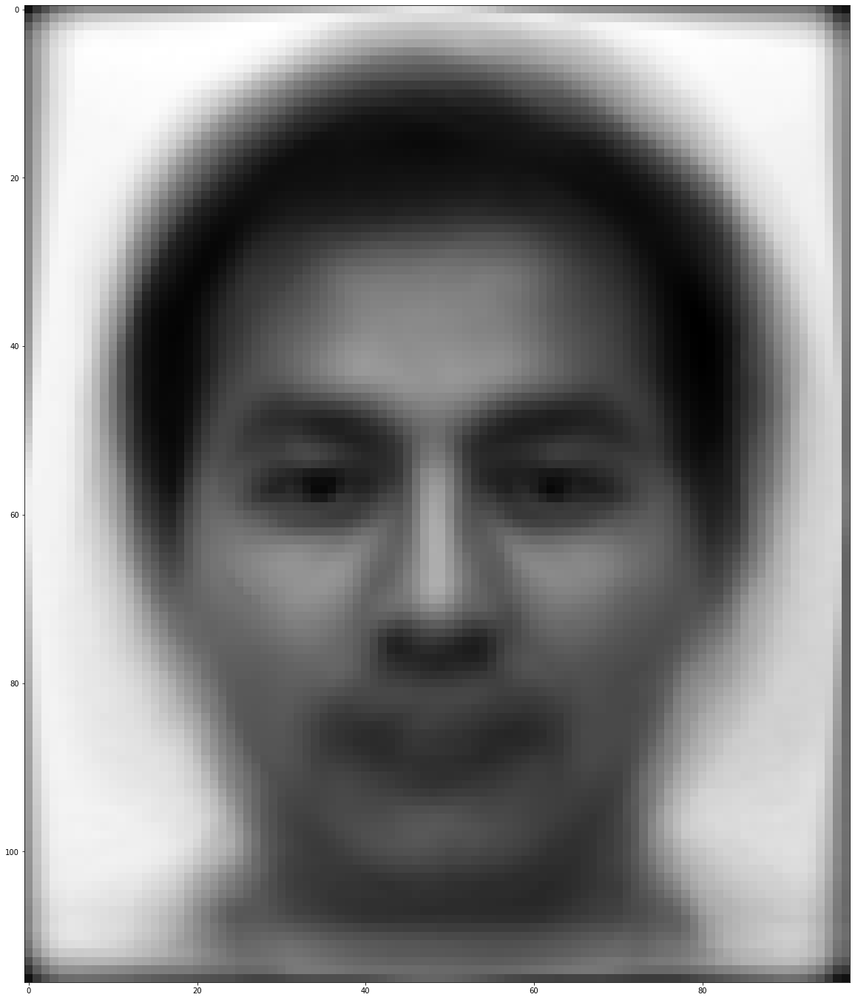

In [3]:
mean_image = np.zeros((img_width, img_height), dtype=np.float)

for image in images:
    mean_image += image
    
mean_image /= 165

plt.figure(figsize=(20, 132))
columns = 1

print(mean_image)

for i in range(1):
    plt.subplot(1, 1, 1)
    plt.imshow(mean_image, cmap="gist_gray")

[-35.48484848 -69.0969697  -92.04848485 ... -71.25454545 -41.0969697
 -34.38787879]


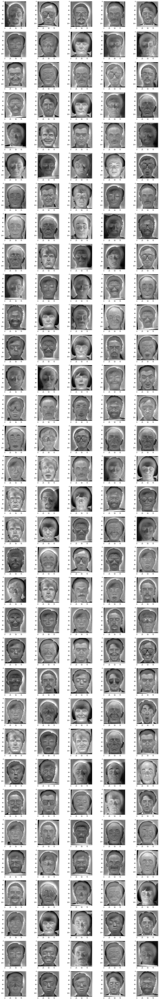

In [5]:
new_images = []

for image in images:
    to_append_image = image - mean_image
    new_images.append(np.reshape(to_append_image, (img_width * img_height, )))
    
new_images = np.array(new_images)

print(new_images[0])

plt.figure(figsize=(20, 132))
columns = 5;

for i, image in enumerate(new_images):
    plt.subplot(len(new_images) / columns + 1, columns, i + 1)
    plt.imshow(np.reshape(image, (img_width, img_height)), cmap="gist_gray")

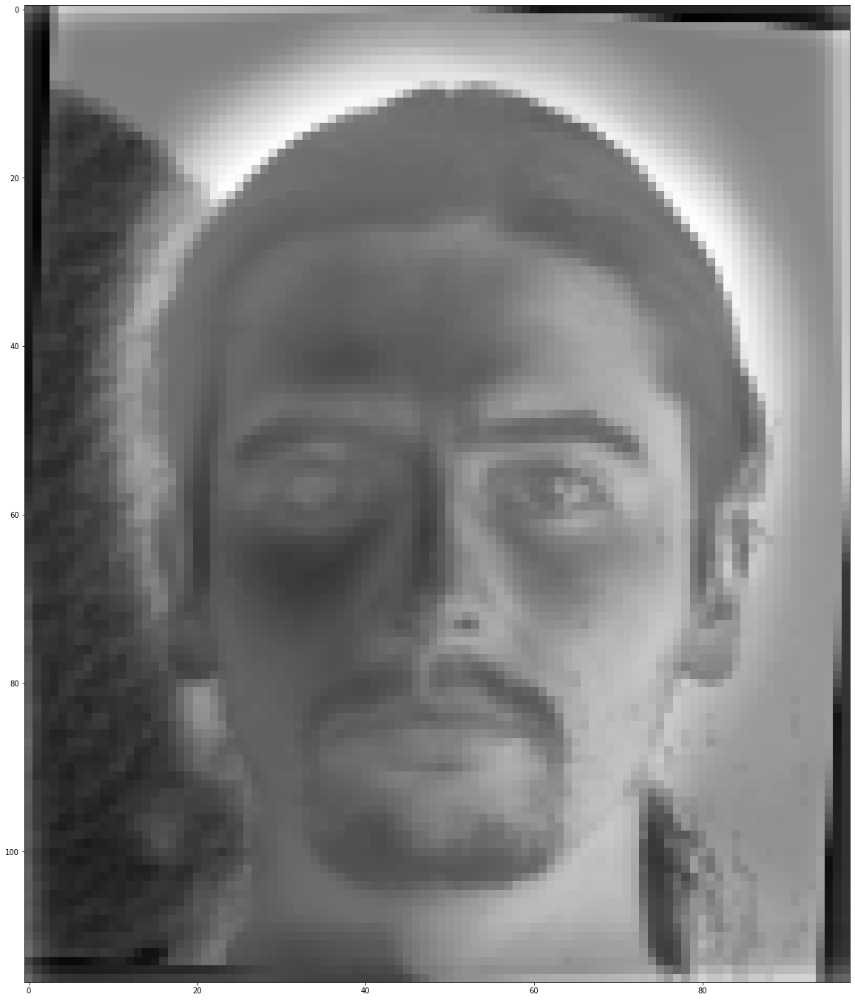

In [13]:
plt.figure(figsize=(20, 132))
columns = 1

for i in range(1):
    image = new_images[0].reshape(img_width, img_height)
    plt.subplot(1, 1, 1)
    plt.imshow(image, cmap="gist_gray")


In [6]:
print(new_images.shape)
U, s, V = linalg.svd(new_images);

(165, 11368)


[0.00557025 0.00567944 0.00272006 ... 0.00656053 0.00457141 0.00532523]


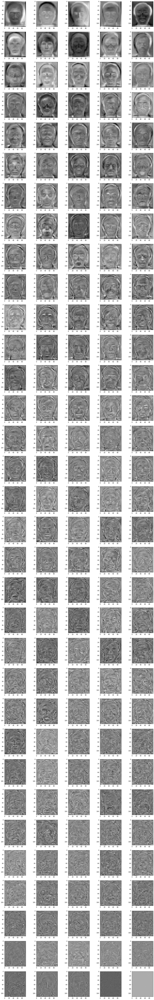

In [7]:
plt.figure(figsize=(20, 132))
columns = 5

print(V[0])

for i in range(165):
    image = V[i].reshape(img_width, img_height)
    plt.subplot(165 / columns, columns, i + 1)
    plt.imshow(image, cmap="gist_gray")

[[ 35.48484848  69.0969697   92.04848485 ...  83.15757576  47.31515152
   36.75757576]
 [ 76.49090909 110.88484848 135.88484848 ... 119.47272727  82.91515152
   71.66060606]
 [103.50909091 138.30909091 163.46060606 ... 152.03030303 113.72121212
   99.48484848]
 ...
 [ 91.01818182 127.97575758 153.82424242 ... 136.06060606 106.45454545
   97.03636364]
 [ 65.2969697  102.4        126.89090909 ... 108.45454545  77.43636364
   69.56969697]
 [ 33.24242424  69.38787879  92.30909091 ...  71.25454545  41.0969697
   34.38787879]]
[-35.48484848 -69.0969697  -92.04848485 ... -71.25454545 -41.0969697
 -34.38787879]


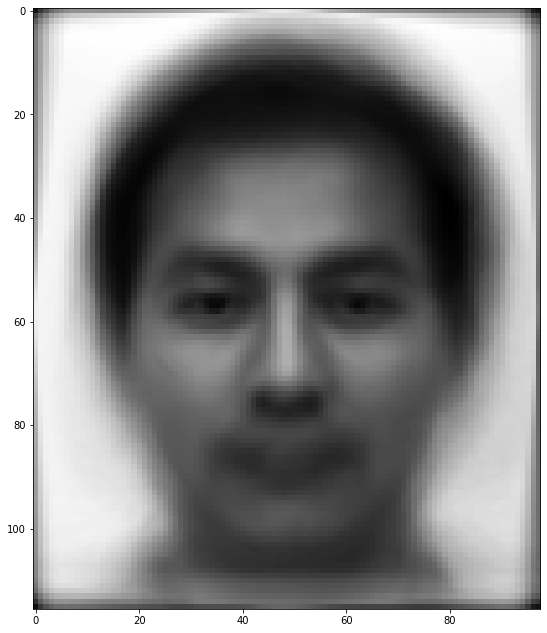

In [16]:
print(mean_image)
print(new_images[0])

plt.figure(figsize=(20, 132))
columns = 2;

for i in range(1):
    plt.subplot(1, columns, i + 1)
    plt.imshow(mean_image, cmap="gist_gray")

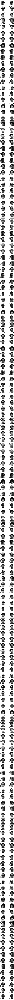

In [9]:
vectorized_images = [np.reshape(image, (img_width * img_height, )) for image in images]
eigenfaces = [np.reshape(image, (img_width, img_height)) for image in V]

num_eigenfaces = 165
reconstructed_faces = []

for i in range(len(vectorized_images)):
    sub_img = vectorized_images[i] - np.reshape(mean_image, (img_width * img_height, ))

    real_image = np.copy(mean_image)
    test_image = np.copy(mean_image)    

    coeffs = []
    for j in range(num_eigenfaces):
        coeffs.append(np.dot(sub_img, V[j]))

    for j in range(num_eigenfaces):
        test_image += (coeffs[j] * eigenfaces[j])
        
    reconstructed_faces.append(test_image)


plt.figure(figsize=(10, 600))
columns = 2;

for i in range(165):
    plt.subplot(165, columns, 2*i + 1)
    plt.imshow(images[i], cmap="gist_gray")
    plt.subplot(165, columns, 2*i + 2)
    plt.imshow(reconstructed_faces[i], cmap="gist_gray")
